[<img src="https://gitlab.irit.fr/toc/etu-n7/controle-optimal/-/raw/master/ressources/Logo-toulouse-inp-N7.png" alt="N7" height="100"/>](https://gitlab.irit.fr/toc/etu-n7/controle-optimal)

<div style="width:90%;
            margin:10px;
            padding:8px;
            background-color:#FAA299;
            border:2px solid #BF381B;
            border-radius:20px;
            font-weight:bold;
            font-size:1em;"> <!-- il faut laisser une ligne vide après celle-ci -->

* Nom : DKHISSI
* Prénom : Mahmoud
</div>

# Transfert orbital

Ce sujet (ou TP-projet) est à rendre (voir la date sur moodle et les modalités du rendu) et sera évalué pour faire partie de la note finale de la matière Contrôle Optimal.

<div style="width:90%;
            margin:10px;
            padding:8px;
            background-color:#afa;
            border:2px solid #bbffbb;
            border-radius:20px;
            font-weight:bold;
            font-size:1.5em;
            text-align:center;">
Transfert orbital à temps minimal
</div>


On considère le problème du transfert d'un satellite d'une orbite initiale à l'orbite géostationnaire à temps minimal. Ce problème s'écrit comme un problème de contrôle optimal sous la forme

$$
\left\lbrace
\begin{array}{l}
    \min J(x, u, t_f) = t_f \\[1.0em]
    \ \ \dot{x}_{1}(t) = ~ x_{3}(t)  \\[0.5em]
    \ \ \dot{x}_{2}(t) = ~ x_{4}(t)  \\[0.5em]
    \ \ \dot{x}_{3}(t) =  -\dfrac{\mu\, x_{1}(t)}{r^{3}(x(t))} + u_{1}(t)  \\[1em]
    \ \ \dot{x}_{4}(t) =  -\dfrac{\mu\, x_{2}(t)}{r^{3}(x(t))} + u_{2}(t), ~~ ||u(t)|| \leq \gamma_\mathrm{max}, ~~ t \in [0,t_f] ~~ \text{p.p.}, ~~ u(t) = (u_1(t),u_2(t)),  \\[1.5em]
    \ \ x_{1}(0)=x_{0,1}, ~~ x_{2}(0)=x_{0,2}, ~~ x_{3}(0)=x_{0,3}, ~~ x_{4}(0)=x_{0,4}, \\[1em]
    \ \ r(x(t_f)) = r_{f}, ~~ x_{3}(t_f)=-\sqrt{\dfrac{\mu}{r_{f}^{3}}}x_{2}(t_f), ~~ x_{4}           (t_f)= \sqrt{\dfrac{\mu}{r_{f}^{3}}}x_{1}(t_f), \\
\end{array}
\right.
$$

avec $r(x)=\sqrt{x_{1}^{2}+x_{2}^{2}}$.
Les unités choisies sont le kilomètre pour les distances et l'heure pour les  temps. On donne les paramètres suivants :
 
$$
\mu=5.1658620912 \times 10^{12} \ \mathrm{km}^{3}.\mathrm{h}^{-2}, \quad r_{f} = 42165 \ \mathrm{km}.
$$

Le paramètre $\gamma_\mathrm{max}$ dépend de la poussée maximale $F_\mathrm{max}$ suivant la relation :

$$
\gamma_\mathrm{max} = \frac{F_\mathrm{max}\times 3600^2}{m} 
$$

où m est la masse du satellite qu'on fixe à $m=2000\ \mathrm{kg}$.

### Résolution via du tir simple indirect

In [8]:
# Packages
import Pkg; 
Pkg.add("DifferentialEquations")
Pkg.add("Plots")
Pkg.add("NLsolve")
Pkg.add("ForwardDiff")
Pkg.add("LinearAlgebra")

┌ Warning: could not download https://pkg.julialang.org/registries
│   exception = Downloads.RequestError("https://pkg.julialang.org/registries", 6, "Could not resolve host: pkg.julialang.org", Downloads.Response(nothing, "https://pkg.julialang.org/registries", 0, "", Pair{String, String}[]))
└ @ Pkg.Registry C:\Users\Dell\AppData\Local\Programs\Julia-1.10.0\share\julia\stdlib\v1.10\Pkg\src\Registry\Registry.jl:69
    Updating registry at `C:\Users\Dell\.julia\registries\General.toml`
   Resolving package versions...
  No Changes to `C:\Users\Dell\.julia\environments\v1.10\Project.toml`
  No Changes to `C:\Users\Dell\.julia\environments\v1.10\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Dell\.julia\environments\v1.10\Project.toml`
  No Changes to `C:\Users\Dell\.julia\environments\v1.10\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Dell\.julia\environments\v1.10\Project.toml`
  No Changes to `C:\Users\Dell\.julia\environments\v1.

In [52]:
using DifferentialEquations, NLsolve, ForwardDiff, Plots, LinearAlgebra
include("utils.jl"); # fonctions utilitaires


In [40]:
# Les constantes du pb
x0     = [-42272.67, 0, 0, -5796.72] # état initial
μ      = 5.1658620912*1e12
rf     = 42165
F_max  = 100
γ_max  = F_max*3600^2/(2000*10^3)
t0     = 0
rf3    = rf^3
α      = sqrt(μ/rf3);

✏️ **_Question 1:_**
    
1. Donner le pseudo-hamiltonien associé au problème de contrôle optimal.

2. Donner le pseudo système hamiltonien
$$
    \vec{H}(x, p, u) = \left(\frac{\partial H}{\partial p}(x, p, u), 
    -\frac{\partial H}{\partial x}(x, p, u) \right).
$$
3. Calculer le contrôle maximisant. On supposera que $(p_3, p_4)\neq (0,0)$.

**Réponse** (double cliquer pour modifier le texte)

<div style="width:90%;
            margin:10px;
            padding:20px;
            background-color:#000000;
            border:2px solid #063970;
            border-radius:20px;
            font-weight:bold;
            font-size:1em;"> <!-- il faut laisser une ligne vide après celle-ci -->

#### Q1 ####

$$
H(t,x,p,u) = p_{1}(t) * x_{3}(t) + p_{2}(t)*x_{4}(t) + p_{3}(t)*(-\dfrac{\mu\, x_{1}(t)}{r^{3}(x(t))} + u_{1}(t)) +p_{4}(t)*(-\dfrac{\mu\, x_{2}(t)}{r^{3}(x(t))} + u_{2}(t))
$$

#### Q2 ####


$$
    \dot{x}(t) = \frac{\partial H}{\partial p}(x, p, u) = (x_{3}(t),x_{4}(t),-\dfrac{\mu\, x_{1}(t)}{r^{3}(x(t))} + u_{1}(t),-\dfrac{\mu\, x_{2}(t)}{r^{3}(x(t))} + u_{2}(t))
$$

$$
    \dot{p}(t) = -\frac{\partial H}{\partial x}(x, p, u) = (\dfrac{\mu*( r^{2}(x(t))-3x_{1}^2)}{r^{5}}*p3 -3*p4*\dfrac{\mu *x_{2}*x_{1}}{r^5},\dfrac{\mu* (r^{2}(x(t))-3x_{2}^2)}{r^{5}}*p4 -3* p3 *\dfrac{\mu *x_{2}*x_{1}}{r^5} ,-p1,-p2)
$$


#### Q3 ####

On doit résoudre le problème d'optimisation et maximiser le terme suivant : 
$$
max_{u_{1}(t),u_{2}(t)} ~~ p_{3}(t)*u_{1}(t) + p_{4}(t)*u_{2}(t)
$$
Sous les contraintes :
$$
~~ ||u(t)|| \leq \gamma_\mathrm{max}
$$

En utilisant le KKT vu au semestre 7 on aura : 
$$
u_{1} = \dfrac{p3*\gamma_\mathrm{max}}{\sqrt{p_{3}^{2}+p_{4}^{2}}} ~~ et ~~ u_{2} = \dfrac{p4*\gamma_\mathrm{max}}{\sqrt{p_{3}^{2}+p_{4}^{2}}}
$$

</div>

✏️ **_Question 2:_** Compléter le code suivant contenant le pseudo-hamiltonien, le pseudo système hamiltonien et le contrôle maximisant.

In [41]:
#####
##### A COMPLETER

# pseudo-Hamiltonien
function H(x, p, u)
    r3 = sqrt(x[1]^2 + x[2]^2)^3
    h = p[1]*x[3] + p[2]*x[4] + p[3]*((-μ*x[1]/r3) + u[1]) + p[4]*((-μ*x[2]/r3) + u[2])
    return h
end

# pseudo système hamiltonien
function Hv(x, p, u)
    n     = size(x, 1)
    dx    = zeros(eltype(x), n)
    dp    = zeros(eltype(x), n)
    r = sqrt(x[1]^2 + x[2]^2)
    dx[1],dx[2],dx[3],dx[4] = x[3], x[4], (-μ*x[1]/r^3) + u[1], (-μ*x[2]/r^3) + u[2]
    dp[1],dp[2],dp[3],dp[4] = μ*((r^2 - 3*x[1]^2)*p[3]/r^5) -(3*p[4]*μ*x[2]*x[1]/r^5), μ*((r^2 - 3*x[2]^2)*p[4]/r^5) -(3*p[3]*μ*x[2]*x[1]/r^5), -p[1], -p[2]
    return dx, dp
end

# Contrôle maximisant
function control(p)
    u    = zeros(eltype(p),2)
    u[1] = (p[3]*γ_max)/sqrt(p[3]^2 + p[4]^2)
    u[2] = (p[4]*γ_max)/sqrt(p[3]^2 + p[4]^2)
    return u
end

#####
##### FIN A COMPLETER

# flot hamiltonien pour le calcul des extrémales
f = Flow((x, p) -> Hv(x, p, control(p)));

On note 
$
    \alpha := \sqrt{\frac{\mu}{r_f^3}}.
$
La condition terminale peut se mettre sous la forme $c(x(t_f)) = 0$, avec $c \colon \mathbb{R}^4 \to \mathbb{R}^3$.

✏️ **_Question 3:_** Donner l'expression de $c(x)$.

**Réponse** (double cliquer pour modifier le texte)

<div style="width:90%;
            margin:10px;
            padding:20px;
            background-color:#000000;
            border:2px solid #063970;
            border-radius:20px;
            font-weight:bold;
            font-size:1em;"> <!-- il faut laisser une ligne vide après celle-ci -->

$$
Soit ~~ x = (x_{1},x_{2},x_{3},x_{4}) ~~ dans ~~ \mathbb{R}^4 \\
c(x) = (\sqrt{x_{1}^2+x_{2}^2}-r_{f},x_{3}+x_{2}*\alpha,x_{4}-x_{1}*\alpha)

$$
</div>

Le temps final étant libre, on a la condition au temps final 

$$
    H(x(t_f), p(t_f), u(t_f)) = -p^0 = 1. \quad \text{(on se place dans le cas normal)}
$$

De plus, la condition de transversalité 

$$
p(t_f) = c'(x(t_f))^T \lambda, ~~ \lambda \in \mathbb{R}^3,
$$

conduit à la relation suivante (où $\lambda$ n'apparaît plus)

$$
\Phi(x(t_f), p(t_f)) := x_2(t_f) \Big( p_1(t_f) + \alpha\, p_4(t_f) \Big) - x_1(t_f) \Big( p_2(t_f) - \alpha\, p_3(t_f) \Big) = 0.
$$

En considérant la condition aux limites, la condition finale sur le pseudo-hamiltonien et la condition de transversalité, la fonction de tir simple est donnée par 

\begin{equation*}
    \begin{array}{rlll}
        S \colon    & \mathbb{R}^5          & \longrightarrow   & \mathbb{R}^5 \\
        & (p_0, t_f)      & \longmapsto       &
        S(p_0, t_f) := \begin{pmatrix}
            c(x(t_f, x_0, p_0)) \\[0.5em]
            \Phi(z(t_f, x_0, p_0)) \\[0.5em]
            H(z(t_f, x_0, p_0), u(z(t_f, x_0, p_0))) - 1
        \end{pmatrix}
    \end{array}
\end{equation*}

où $z(t_f, x_0, p_0)$ est la solution au temps $t_f$ du pseudo système hamiltonien bouclé par
le contrôle maximisant, partant au temps $t_0=0$ du point $(x_0, p_0)$. On rappelle que l'on note
$z=(x, p)$.

✏️ **_Question 4:_** Compléter le code suivant de la fonction de tir.

In [42]:
#####
##### A COMPLETER

# Fonction de tir
function shoot(p0, tf)
    s = zeros(eltype(p0), 5)
    x, p = f(t0, x0, p0, tf)
    s[1] = sqrt(x[1]^2 + x[2]^2) - rf
    s[2] = x[3] + x[2]*α
    s[3] = x[4] - x[1]*α
    s[4] = x[2]*(p[1]+ α*p[4]) - x[1]*(p[2] - α*p[3])
    s[5] = H(x, p, control(p)) -1
    return s
end;

✏️ **_Question 5:_** Expliquer simplement ce que fait le code suivant.

**Réponse** (double cliquer pour modifier le texte)

<div style="width:90%;
            margin:10px;
            padding:20px;
            background-color:#000000;
            border:2px solid #063970;
            border-radius:20px;
            font-weight:bold;
            font-size:1em;"> <!-- il faut laisser une ligne vide après celle-ci -->

Le code utilise une méthode itérative pour trouver les meilleures valeurs initiales de p0 et du temps final (tf) qui respectent les conditions définies par la fonction foo. Il ajuste ces valeurs jusqu'à ce qu'une solution satisfaisante(qui converge) soit trouvée, puis récupère les résultats pour utilisation ultérieure.
</div>

In [43]:
# Itéré initial
y_guess = [1.0323e-4, 4.915e-5, 3.568e-4, -1.554e-4, 13.4]   # pour F_max = 100N

# Jacobienne de la fonction de tir
foo(y)  = shoot(y[1:4], y[5])
jfoo(y) = ForwardDiff.jacobian(foo, y)

# Résolution de shoot(p0, tf) = 0
nl_sol = nlsolve(foo, jfoo, y_guess; xtol=1e-8, method=:trust_region, show_trace=true);

# On récupère la solution si convergence
if converged(nl_sol)
    p0_sol_100 = nl_sol.zero[1:4]
    tf_sol_100 = nl_sol.zero[5]
    println("\nFinal solution:\n", nl_sol.zero)
else
    error("Not converged")
end

Iter     f(x) inf-norm    Step 2-norm 
------   --------------   --------------
     0     4.208247e+02              NaN
     1     3.419791e+00     3.507495e-03
     2     8.493478e-02     3.222915e-04
     3     4.212761e-07     3.247983e-06
     4     8.731149e-11     2.965184e-10

Final solution:
[0.00010323118913618858, 4.892642781236135e-5, 0.0003567967293906536, -0.00015536138862860046, 13.403181957149329]


In [44]:
# Fonction d'affichage d'une solution
function plot_solution(p0, tf)

    # On trace l'orbite de départ et d'arrivée
    gr(dpi=300, size=(500,400), thickness_scaling=1)
    r0        = norm(x0[1:2])
    v0        = norm(x0[3:4])
    a         = 1.0/(2.0/r0-v0*v0/μ)
    t1        = r0*v0*v0/μ - 1.0;
    t2        = (x0[1:2]'*x0[3:4])/sqrt(a*μ);
    e_ellipse = norm([t1 t2])
    p_orb     = a*(1-e_ellipse^2);
    n_theta   = 101
    Theta     = range(0, stop=2*pi, length=n_theta)
    X1_orb_init = zeros(n_theta)
    X2_orb_init = zeros(n_theta)
    X1_orb_arr  = zeros(n_theta)
    X2_orb_arr  = zeros(n_theta)

    # Orbite initiale
    for  i in 1:n_theta
        theta = Theta[i]
        r_orb = p_orb/(1+e_ellipse*cos(theta));
        X1_orb_init[i] = r_orb*cos(theta);
        X2_orb_init[i] = r_orb*sin(theta);
    end

    # Orbite d'arrivée
    for  i in 1:n_theta
        theta = Theta[i]
        X1_orb_arr[i] = rf*cos(theta) ;
        X2_orb_arr[i] = rf*sin(theta);
    end;

    # Calcul de la trajectoire
    ode_sol  = f((t0, tf), x0, p0)
    t  = ode_sol.t
    x1 = [ode_sol[1, j] for j in 1:size(t, 1) ]
    x2 = [ode_sol[2, j] for j in 1:size(t, 1) ]
    u  = zeros(2, length(t))

    for j in 1:size(t, 1)
        u[:,j] = control(ode_sol[5:8, j])
    end

    px = plot(x1, x2, color=:red, legend=:best, label="Trajectoire",
        border=:none, size = (800,400), aspect_ratio=:equal)
    plot!(px, X1_orb_init, X2_orb_init, color=:green, label="Orbite initiale")
    plot!(px, X1_orb_arr, X2_orb_arr, color=:blue, label="Orbite d'arrivée")
    plot!(px, [x0[1]], [x0[2]], seriestype=:scatter, color=:green, markersize = 5, label="Départ")
    xf = ode_sol[1:2, end]
    plot!(px, [xf[1]], [xf[2]], seriestype=:scatter, color=:red, markersize = 5, label="Arrivée")
    plot!(px, [0.0], [0.0], color = :blue, seriestype=:scatter, markersize = 25, label="Terre")

    pu1 = plot(t, u[1,:], color=:red, label="u₁(t)", legend=:best)
    pu2 = plot(t, u[2,:], color=:red, label="u₂(t)", legend=:best)

    display(plot(pu1, pu2, layout = (1,2), size = (800,400)))
    display(px)
    
end;

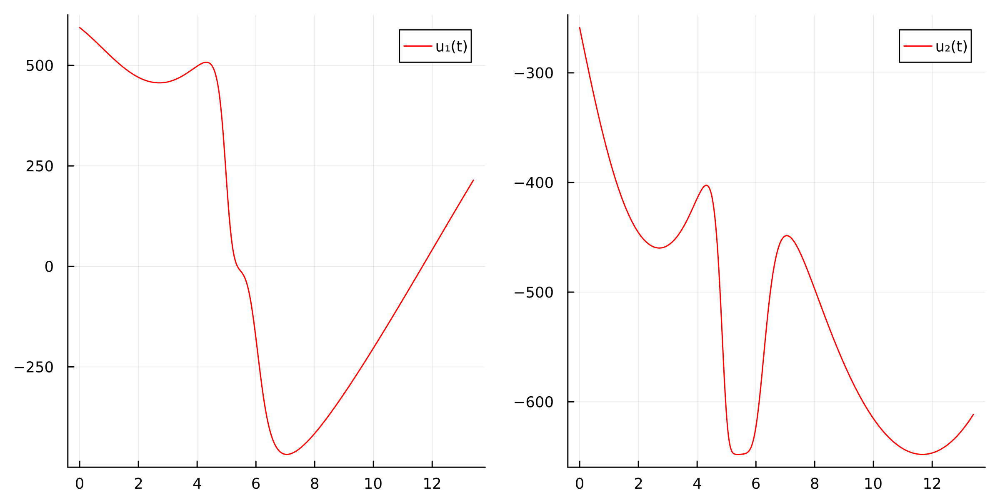

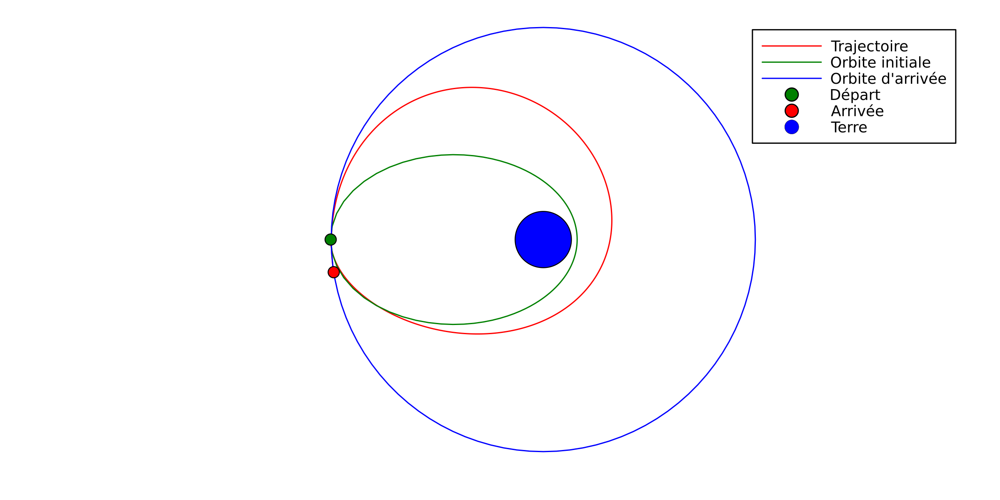

In [45]:
# On affiche la solution pour Fmax = 100
plot_solution(p0_sol_100, tf_sol_100)

✏️ **_Question 6:_** Que vaut le temps final $t_f$ (à 5 digits près) ? Combien de révolutions complètes autour de la Terre a réalisé le satellite.

**Réponse** (double cliquer pour modifier le texte)

<div style="width:90%;
            margin:10px;
            padding:20px;
            background-color:#000000;
            border:2px solid #063970;
            border-radius:20px;
            font-weight:bold;
            font-size:1em;"> <!-- il faut laisser une ligne vide après celle-ci -->

$$
t_{f} = 13.40318
$$

Le satellite a fait une révolution complère autour de la Terre (orbite rouge).
</div>

### Etude du temps de transfert en fonction de la poussée maximale

✏️ **_Question 7:_** 

* A l'aide de ce que vous avez fait précédemment, déterminer $t_f$ (attention, penser à bien itinialiser la
méthode de tir) pour
    
$$
    F_\mathrm{max} \in \{100, 90, 80, 70, 60, 50, 40, 30, 20 \}.
$$
    
* Tracer ensuite $t_f$ en fonction de $F_\mathrm{max}$ et commenter le résultat.

**Réponse** (double cliquer pour modifier le texte et donner votre commentaire)

<div style="width:90%;
            margin:10px;
            padding:20px;
            background-color:#000000;
            border:2px solid #063970;
            border-radius:20px;
            font-weight:bold;
            font-size:1em;"> <!-- il faut laisser une ligne vide après celle-ci -->

Le tracé en bas révèle une relation inverse entre la poussée maximale $F_{max}$ et le temps final $t_{f}$. Autrement dit, à mesure que la poussée maximale augmente, le temps nécessaire pour accomplir la mission spatiale diminue.
</div>

In [46]:
# Les différentes valeurs de poussées
F_max_span = range(100, stop=20, length=11);
γ_max_span = [F_max_span[j]*3600^2/(2000*10^3) for j in 1:size(F_max_span,1)];

In [47]:
# Solution calculée précédemment
y_guess = [p0_sol_100; [tf_sol_100]]

# Pour le stockage des solutions
tf_sols = zeros(length(γ_max_span))     # vecteur des temps de transfert
p0_sols = zeros(4, length(γ_max_span))  # matrice des co-états initiaux

#####
##### A COMPLETER
for i in 1:length(γ_max_span)
    
    γ_max = γ_max_span[i];

    # Jacobienne de la fonction de tir
    foo(y)  = shoot(y[1:4], y[5])
    jfoo(y) = ForwardDiff.jacobian(foo, y)
    # Résolution de shoot(p0, tf) = 0
    nl_sol = nlsolve(foo, jfoo, y_guess; xtol=1e-8, method=:trust_region, show_trace=true);

    # On récupère la solution si convergence
    if converged(nl_sol)
        tf_sol = nl_sol.zero[5]
        tf_sols[i] = tf_sol
        p0_sol = nl_sol.zero[1:4]
        p0_sols[:,i] = p0_sol
        y_guess = [p0_sol; [tf_sol]]
        println("\nFinal solution:\n", nl_sol.zero)
    else
        error("Not converged")
    end
end


Iter     f(x) inf-norm    Step 2-norm 
------   --------------   --------------

Final solution:
[0.00010323118913618858, 4.892642781236135e-5, 0.0003567967293906536, -0.00015536138862860046, 13.403181957149329]
Iter     f(x) inf-norm    Step 2-norm 
------   --------------   --------------
     0     4.838808e+02              NaN
     1     4.453296e+02     4.196162e-01
     2     7.423952e+00     2.248534e-02
     3     2.765054e-01     2.855708e-03
     4     4.593263e-06     1.509751e-05
     5     1.018634e-10     2.229432e-09

Final solution:
[8.581713189736759e-5, 4.823434017280032e-5, 0.0003517496696054269, -0.0002655600836094213, 13.842412694293019]
Iter     f(x) inf-norm    Step 2-norm 
------   --------------   --------------
     0     5.679920e+02              NaN
     1     8.759384e+02     0.000000e+00
     2     8.759384e+02     0.000000e+00
     3     8.759384e+02     0.000000e+00
     4     3.447609e+02     3.716917e-01
     5     2.033600e+02     1.871190e-01
     6 

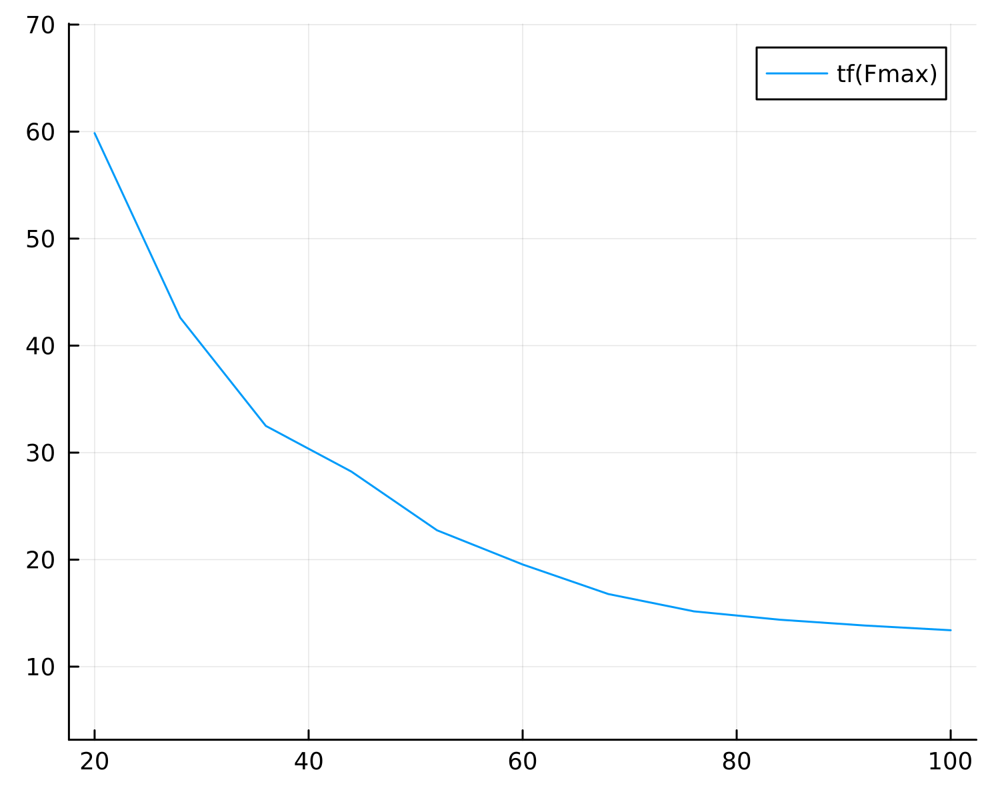

In [48]:
# Affichage de tf en fonction de la poussée maximale
plot(F_max_span, tf_sols, aspect_ratio=:equal, legend=:best, label="tf(Fmax)")

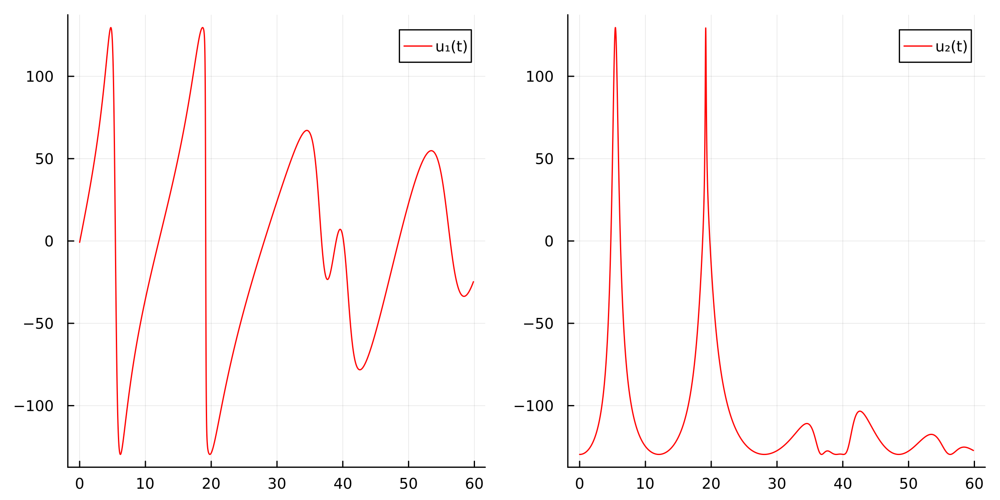

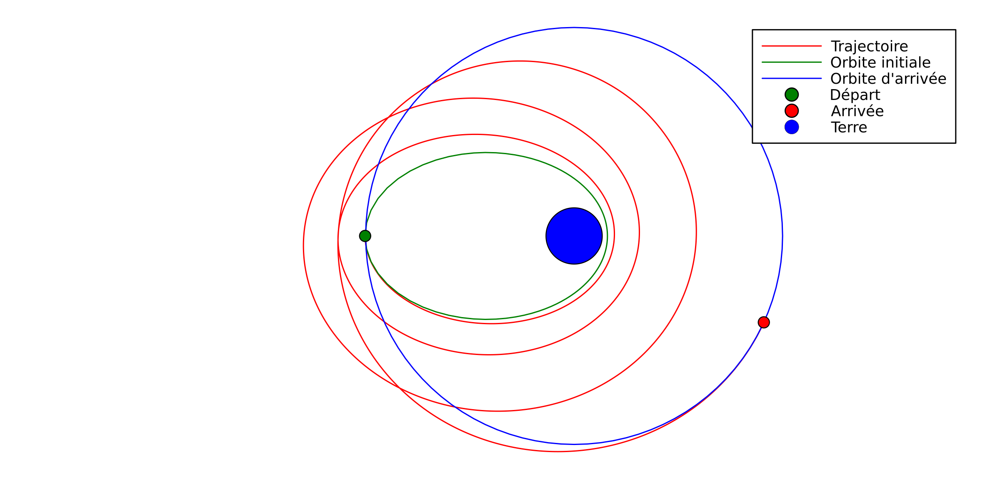

In [49]:
# Plots sol pour F_max = 20N
i = 11
γ_max = γ_max_span[i]
plot_solution(p0_sols[:, i], tf_sols[i])

### Animation

Juste pour s'amuser

In [50]:
include("space.jl"); using .Space

Fps     = 3
NFrame  = 100
Vitesse = 0.3684871655899522
Durée totale de la mission = 90.459957485809 h


┌ Info: Saved animation to c:\Users\Dell\Desktop\ok\transfert-temps-min.gif
└ @ Plots C:\Users\Dell\.julia\packages\Plots\sxUvK\src\animation.jl:156


Plots.AnimatedGif("c:\\Users\\Dell\\Desktop\\ok\\transfert-temps-min.gif")
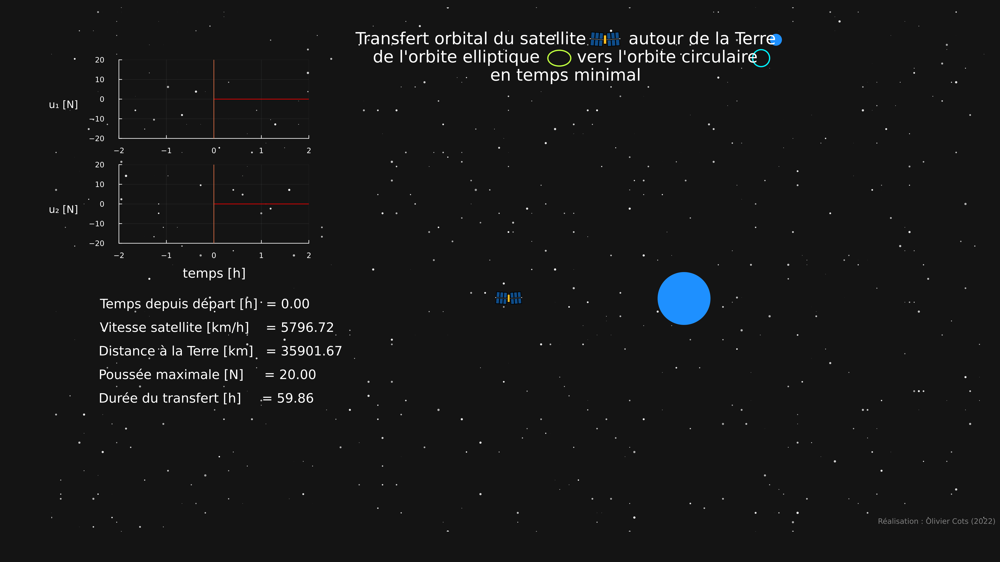

In [51]:
# solution choice
i = 11
γ_max = γ_max_span[i] # γ_max must be updated for the use of the flow

# animation
# nFrame = 100; d = 30; fps = floor(Int, nFrame/d) => 2 minutes and 30 seconds of computation
nFrame = 100; d = 30; fps = floor(Int, nFrame/d)
Space.animation(p0_sols[:, i], tf_sols[i], f, γ_max, nFrame=nFrame, fps=fps)

<div style="width:90%;
            margin:10px;
            padding:8px;
            background-color:#afa;
            border:2px solid #bbffbb;
            border-radius:20px;
            font-weight:bold;
            font-size:1.5em;
            text-align:center;">
Transfert orbital à consommation minimale
</div>

On considère maintenant le problème du transfert d'un satellite d'une orbite initiale à une orbite géostationnaire à temps final fixé en cherchant à minimiser la consommation de carburant. Ce problème s'écrit comme un problème de contrôle optimal sous la forme

$$
\left\lbrace
\begin{array}{l}
    \displaystyle \min J(x, u) = \int_{0}^{t_f} \Vert u(t)\Vert \mathrm{d}t \\[1.0em]
    \ \ \dot{x}_{1}(t) = ~ x_{3}(t)  \\[0.5em]
    \ \ \dot{x}_{2}(t) = ~ x_{4}(t)  \\[0.5em]
    \ \ \dot{x}_{3}(t) =  -\dfrac{\mu\, x_{1}(t)}{r^{3}(x(t))} + u_{1}(t)  \\[1em]
    \ \ \dot{x}_{4}(t) =  -\dfrac{\mu\, x_{2}(t)}{r^{3}(x(t))} + u_{2}(t), ~~ ||u(t)|| \leq \gamma_\mathrm{max}, ~~ t \in [0,t_f] ~~ \text{p.p.}, ~~ u(t) = (u_1(t),u_2(t)),  \\[1.5em]
    \ \ x_{1}(0)=x_{0,1}, ~~ x_{2}(0)=x_{0,2}, ~~ x_{3}(0)=x_{0,3}, ~~ x_{4}(0)=x_{0,4}, \\[1em]
    \ \ r(x(t_f)) = r_{f}, ~~ x_{3}(t_f)=-\sqrt{\dfrac{\mu}{r_{f}^{3}}}x_{2}(t_f), ~~ x_{4}           (t_f)= \sqrt{\dfrac{\mu}{r_{f}^{3}}}x_{1}(t_f). \\
\end{array}
\right.
$$

Toutes les constantes sont identiques au problème précédent. On considéra le problème avec $F_\mathrm{max} = 100$ et on prendre comme temps final : $t_f = 1.5 T^{100}_{\min}$, où $T^{100}_{\min}$ correspond au temps minimal solution du problème précédent pour $F_\mathrm{max} = 100$.

**Remarques importantes.** 

* On ne considèrera que des extrémales normales, c'est-à-dire $p^0 = -1$.
* Le problème a de la structure, le contrôle optimal est composé d'arcs où la poussée est nulle $u(t) = 0$ et où la poussée est maximale $\Vert u(t)\Vert = \gamma_\mathrm{max}$.
* Vous devrez dans un premier temps résoudre le problème avec le coût suivant ce qui permet de le régulariser et ainsi d'utiliser une méthode de tir simple :

$$
\int_{0}^{t_f} \left( \Vert u(t)\Vert - \varepsilon \left( \ln(\Vert u(t)\Vert) + \ln(\gamma_\mathrm{max}-\Vert u(t)\Vert) \right) \right) \mathrm{d}t.
$$

✏️ **_Question 8:_** Résoudre via du tir simple le problème régularisé pour différentes valeurs de $\varepsilon$ suffisamment petites pour déterminer la structure optimale, en commençant avec $\varepsilon$ suffisamment grand pour faire converger la méthode de tir plus facilement.

✏️ **_Question 9:_** Résoudre via du tir multiple le problème de transfert orbital à consommation minimale. Vous utilisez la structure obtenue précédemment et vous donnerez au solveur une bonne condition initiale à l'aide de la question précédente.